## EAD - Exposure at Default Model

This notebook aims to come up with a general methodology for developing a model for estimating EAD - Exposure at Default.

**EAD** represents the amount of exposure at the moment the borrower defaulted.

In [1]:
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

import warnings
warnings.filterwarnings("ignore")

from credit_risk_modeling.cleaning import DatetimeConverter, NumericExtractor
from credit_risk_modeling.eda import boxplot_by_categories, correlation_heatmap, regression_plot
from credit_risk_modeling.feature_engineering import TimeSinceCalculator, OHECategoriesCreator
from credit_risk_modeling.evaluation import get_regression_metrics, plot_regression_curves

#### Get data and select columns

In [2]:
selected_cols = [
    "id", "member_id", "loan_amnt", "funded_amnt", "term", "int_rate", "installment", "grade", "emp_length", 
    "home_ownership", "annual_inc", "issue_d", "loan_status", "purpose", "addr_state", "dti", "delinq_2yrs", 
    "earliest_cr_line", "verification_status", "initial_list_status", "inq_last_6mths", "open_acc", "pub_rec", 
    "total_acc", "total_rev_hi_lim", "recoveries", "total_rec_prncp"
]

In [3]:
df = pd.read_csv("../data/loan_data.csv")
df = df.loc[:, selected_cols]

#### Clean, Preprocess and Create Features

In [4]:
df["earliest_cr_line"].isnull().sum()

29

In [5]:
df["earliest_cr_line"] = df["earliest_cr_line"].fillna(df["issue_d"])

In [6]:
datetime_cols = ["earliest_cr_line", "issue_d"]
datetime_format = "%b-%y"
time_unit = "month"
reference_date = datetime(2017, 12, 1)

datetime_converter = DatetimeConverter(
    field_names=datetime_cols,
    datetime_format=datetime_format
)
df = datetime_converter.transform(df)

for datetime_col in datetime_cols:
    time_since_calculator = TimeSinceCalculator(
        field_name=datetime_col, reference_date=reference_date, time_unit=time_unit, winsorize_max=True,
    )
    df = time_since_calculator.transform(df)

In [7]:
emp_length_extractor = NumericExtractor(
    field_name="emp_length",
    regex_extraction=r"(.+)\syears?",
    post_mapping={r"10\+\s?": str(10), r"< 1\s?": str(0)},
)
df = emp_length_extractor.transform(df)

emp_length_extractor = NumericExtractor(
    field_name="term",
    regex_extraction=r"(\d+)",
)
df = emp_length_extractor.transform(df)

In order for us to continue with the analysis, we just need to carry out two additional steps:

* Define target variable

When building LGD models, it is good practice to build models with data from borrowers that have had enough time to repay part of the remaining debt.

Hence, we are going to take into account only borrowers that are written-off - which is indicated by `loan_status` equal to:

* `Charged Off`

* `Does not meet the credit policy. Status:Charged Off`

In [8]:
DEFAULT_CATEGORIES = [
    "Charged Off",
    "Does not meet the credit policy. Status:Charged Off"
]

df = df[df["loan_status"].isin(DEFAULT_CATEGORIES)]

From the data provided, we know that:

* `funded_amnt`: reflects the total amount the borrower applied for;

* `total_rec_prncp`: amount that has been recovered.

Hence, EAD can be defined as:

$EAD = funded\_amnt - total\_rec\_prncp$

For the sake of simplicity and ease of development, we will instead build a model to predict **CCF - Credit Conversion Factor**, which basically indicates the portion of the original amount that will still be outstanding at the momento fo default.

$CCF = \frac{EAD}{funded\_amnt} = \frac{funded\_amnt - total\_rec\_prncp}{funded\_amnt}$

In [9]:
TARGET_VARIABLE = "CCF"

df[TARGET_VARIABLE] = (df["funded_amnt"] - df["total_rec_prncp"]) / df["funded_amnt"]
df[TARGET_VARIABLE].describe()

count    43236.000000
mean         0.735952
std          0.200742
min          0.000438
25%          0.632088
50%          0.789908
75%          0.888543
max          1.000000
Name: CCF, dtype: float64

In [10]:
df[TARGET_VARIABLE].isnull().mean()

0.0

* Split our dataset into training and test, so that we avoid data leakage at all costs.

In [11]:
df_train, df_test = train_test_split(df, test_size=0.20, random_state=99)

From the visualizations below, we can easily notice that our target variable is evenly distributed. Theregore, it won't be necessary to apply a Zero Inflated Regression under these circumstances.

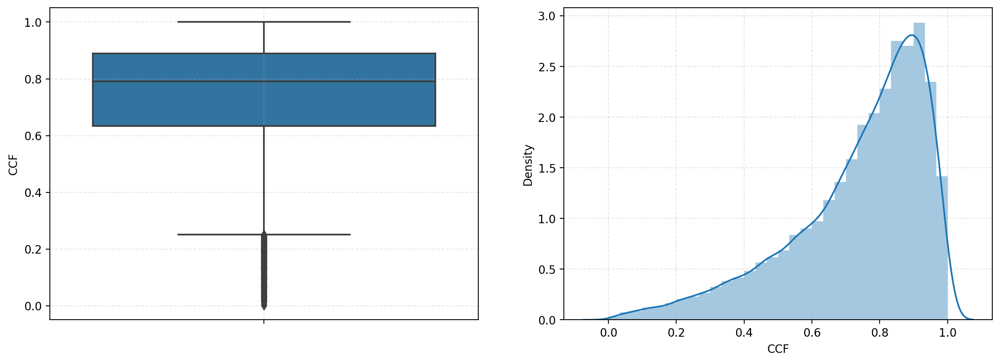

In [12]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

sns.boxplot(data=df_train, y=TARGET_VARIABLE, ax=ax1)
ax1.grid(alpha=0.3, linestyle="--")
sns.distplot(df_train[TARGET_VARIABLE], bins=30, ax=ax2)
ax2.grid(alpha=0.3, linestyle="--")

plt.show()

#### Categorical Features

We will consider the categories we've come up with for the PD model, and take a look at how they are related to the target variable.

* `grade`
* `home_ownership`
* `addr_state`
* `verification_status`
* `purpose`
* `initial_list_status`

In [13]:
transformers = []
features = []
reference_categories = []

In [14]:
variable = "grade"
final_categories = {
    "A": ["A"],
    "B": ["B"],
    "C": ["C"],
    "D": ["D"],
    "E": ["E"],
    "F": ["F"],
    "G": ["G"],
}

grade_ohe = OHECategoriesCreator(field_name=variable, final_categories_dict=final_categories)
df_train = grade_ohe.fit_transform(df_train)
transformers.append(grade_ohe)
features += [f"{variable}_{cat}" for cat in final_categories.keys()]
reference_categories.append(f"{variable}_" + "G")

In [15]:
variable = "home_ownership"
final_categories = {
    "NONE_OTHER_RENT_ANY": ["NONE", "OTHER", "RENT", "ANY"],
    "MORTGAGE": ["MORTGAGE"],
    "OWN": ["OWN"],
}

grade_ohe = OHECategoriesCreator(field_name=variable, final_categories_dict=final_categories)
df_train = grade_ohe.fit_transform(df_train)
transformers.append(grade_ohe)
features += [f"{variable}_{cat}" for cat in final_categories.keys()]
reference_categories.append(f"{variable}_" + "NONE_OTHER_RENT_ANY")

In [16]:
variable = "addr_state"
final_categories = {
    "NV_ND_ME_NE_IA": ["NV", "ND", "ME", "NE", "IA"],
    "HI": ["HI"],
    "FL": ["FL"],
    "AL_OK_LA": ["AL", "OK", "LA"],
    "NY": ["NY"],
    "MO": ["MO"],
    "MD_NJ_VA_NC_NM": ["NJ", "VA", "NC", "NM", "MD"],
    "CA": ["CA"],
    "TN_AZ_MI": ["TN", "AZ", "MI"],
    "KY_RI_ID": ["KY", "RI", "ID"],
    "PA_AR_OH_UT": ["PA", "AR", "OH", "UT"],
    "MN_MA_SD": ["MN", "MA", "SD"],
    "IN_OR_WA_GA": ["IN", "OR", "WA", "GA"],
    "WI_DE": ["WI", "DE"],
    "IL": ["IL"],
    "TX": ["TX"],
    "CT": ["CT"],
    "WV_KS_CO_SC": ["WV", "KS", "CO", "SC"],
    "MS_AK_MT_VT": ["MS", "AK", "MT", "VT"],
    "NH_WY_DC": ["NH", "WY", "DC"],   
}

grade_ohe = OHECategoriesCreator(field_name=variable, final_categories_dict=final_categories)
df_train = grade_ohe.fit_transform(df_train)
transformers.append(grade_ohe)
features += [f"{variable}_{cat}" for cat in final_categories.keys()]
reference_categories.append(f"{variable}_" + "NV_ND_ME_NE_IA")

In [17]:
variable = "verification_status"
final_categories = {
    v: [v] for v in df_train[variable].unique()
}

grade_ohe = OHECategoriesCreator(field_name=variable, final_categories_dict=final_categories)
df_train = grade_ohe.fit_transform(df_train)
transformers.append(grade_ohe)
features += [f"{variable}_{cat}" for cat in final_categories.keys()]
reference_categories.append(f"{variable}_" + "Verified")

In [18]:
variable = "purpose"
final_categories = {
    "car": ["car"],
    "credit_card": ["credit_card"],
    "major_purchase_home_improvement": ["major_purchase", "home_improvement"],
    "debt_consolidation": ["debt_consolidation"],
    "vacation_wedding": ["vacation", "wedding"],
    "medical": ['medical'],
    "other": ["other"],
    "renewable_energy_house_moving": ["renewable_energy", "house", "moving"],
    "educational_small_business": ["small_business", "educational"],
}

grade_ohe = OHECategoriesCreator(field_name=variable, final_categories_dict=final_categories)
df_train = grade_ohe.fit_transform(df_train)
transformers.append(grade_ohe)
features += [f"{variable}_{cat}" for cat in final_categories.keys()]
reference_categories.append(f"{variable}_" + "educational_small_business")

In [19]:
variable = "initial_list_status"
final_categories = {
    v: [v] for v in df_train[variable].unique()
}

grade_ohe = OHECategoriesCreator(field_name=variable, final_categories_dict=final_categories)
df_train = grade_ohe.fit_transform(df_train)
transformers.append(grade_ohe)
features += [f"{variable}_{cat}" for cat in final_categories.keys()]
reference_categories.append(f"{variable}_" + "f")

##### EDA

In [20]:
boxplot_by_categories(df_train, features=features, target_variable=TARGET_VARIABLE)

44it [00:18,  2.34it/s]


It is quite interesting to note that the scenario is the opposite in comparison to the PD model: the riskier the category, the higher the recovery rate. It is very likely that the reason is related to the fact that for the riskiest borrowers, loan is granted for scenarios where there are some safeguards in place for the recovery of the value - which actually makes sense from a business perspective.

#### Numeric Features

Since we are developing a regression model, which is not required to be either explainable or interpretable by expternal regulator, there is no need for binning numeric variables. Thus, we can proceed straight to EDA. 

In [21]:
numeric_features = [
    "term",
    "emp_length",
    "months_since_issue_d",
    "int_rate",
    "funded_amnt",
    "months_since_earliest_cr_line",
    "annual_inc",
    "delinq_2yrs",
    "inq_last_6mths",
    "open_acc",
    "pub_rec",
    "total_acc",
    "dti",
    "total_rev_hi_lim",
]
df_train[numeric_features] = df_train[numeric_features].astype(float)

14it [00:18,  1.29s/it]


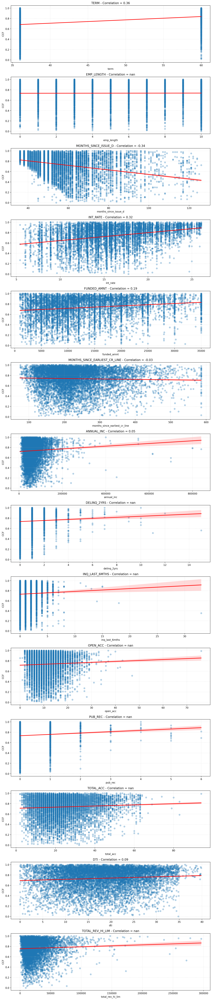

In [22]:
regression_plot(
    data=df_train,
    features=numeric_features,
    target_variable=TARGET_VARIABLE,
    sample_size=10_000
)

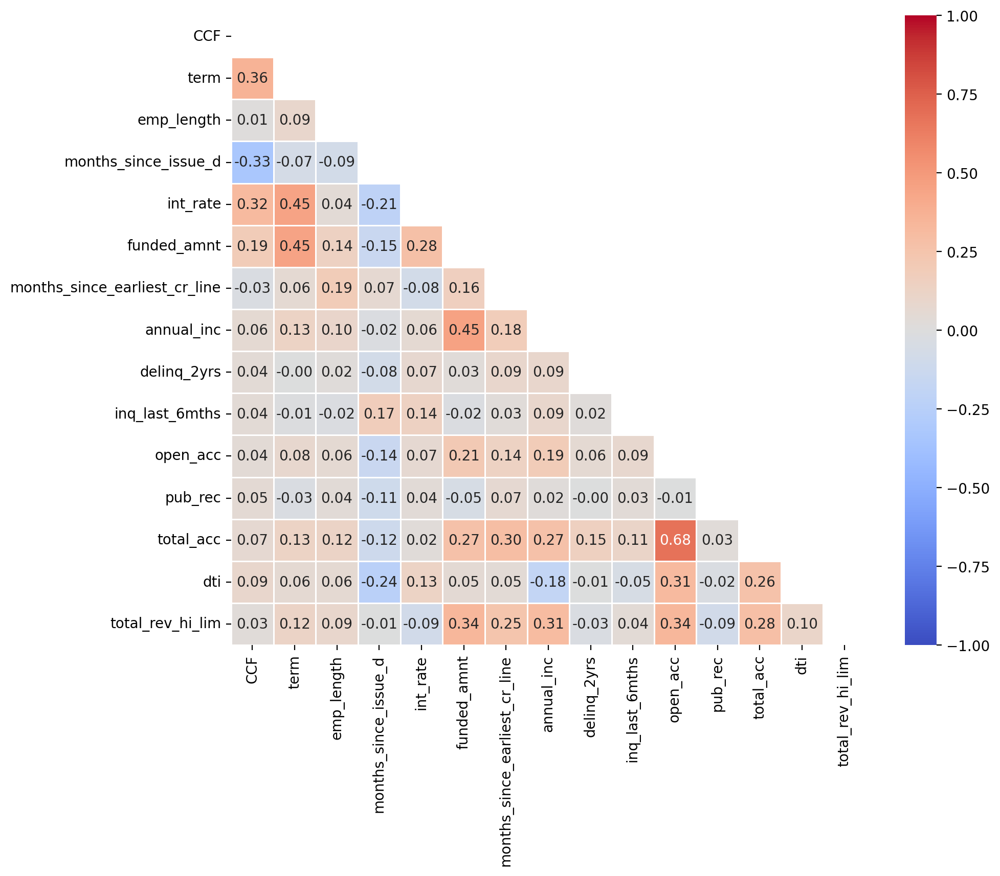

In [23]:
correlation_heatmap(data=df_train, features=numeric_features, target_variable=TARGET_VARIABLE)

From the visualizations above, we can conclude that there is no variable that is highly correlated with our target variable. Hence, we will have to rely on more complex models - such as XGBoost - to do the job for us in finding the best patterns for our purposes.

#### Model development

In this case, we can rely on regular regression, as we do not have a lot of 0s that stand out from the distribution.

In [24]:
model = XGBRegressor(
    objective="reg:squarederror",
    n_estimators=100,
    max_depth=3,
    seed=99,
)

In [25]:
final_features = list(
    filter(lambda x: x not in reference_categories, features)
) + numeric_features

In [26]:
model.fit(df_train[final_features], df_train[TARGET_VARIABLE])

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

##### Applying same transformations to TEST DATASET

In [27]:
for transformer in transformers:
    df_test = transformer.transform(df_test)
df_test[numeric_features] = df_test[numeric_features].astype(float)

##### Generating Predictions for Training and Test Sets

In [28]:
y_pred_train = model.predict(df_train[final_features])
y_pred_test = model.predict(df_test[final_features])

Clipping values between 0 and 1

In [29]:
y_pred_train = np.clip(y_pred_train, 0, 1)
y_pred_test = np.clip(y_pred_test, 0, 1)

#### Evaluation of Model Performance

From the evaluation metrics and visualizations, we can conclude that results are mildly satisfactory, although we are able to build a reasonable model that follows a conservative approach from credit risk management perspective. Predicted CCFs are usually higher than they should be - which suits well our case.

In [30]:
metrics_df = pd.DataFrame([
    get_regression_metrics(y_pred=y_pred_train, y_true=df_train[TARGET_VARIABLE])
], index=["TRAIN"])

metrics_df = pd.concat([
    metrics_df,
    pd.DataFrame([
        get_regression_metrics(y_pred=y_pred_test, y_true=df_test[TARGET_VARIABLE])
    ], index=["TEST"])
], axis=0)
metrics_df

,# OBS,RMSE,R2,MAE
TRAIN,34588,0.160502,0.357800,0.120901
TEST,8648,0.168029,0.311337,0.126633


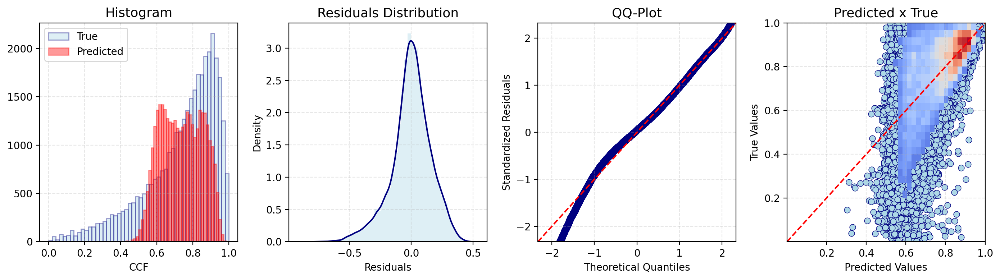

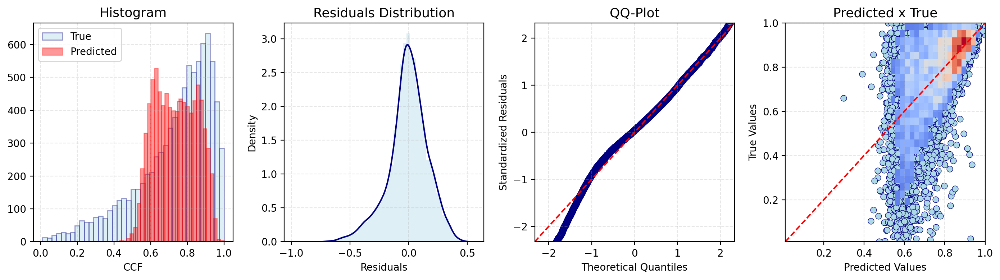

In [31]:
plot_regression_curves(
    y_pred=y_pred_train, y_true=df_train[TARGET_VARIABLE], name="TRAIN"
)
plot_regression_curves(
    y_pred=y_pred_test, y_true=df_test[TARGET_VARIABLE], name="TEST"
)